
Information About Data:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Store ID               30000 non-null  object 
 1   Product ID             30000 non-null  int64  
 2   Date                   30000 non-null  object 
 3   Units Sold             30000 non-null  int64  
 4   Sales Revenue (USD)    30000 non-null  float64
 5   Discount Percentage    30000 non-null  int64  
 6   Marketing Spend (USD)  30000 non-null  int64  
 7   Store Location         30000 non-null  object 
 8   Product Category       30000 non-null  object 
 9   Day of the Week        30000 non-null  object 
 10  Holiday Effect         30000 non-null  bool   
dtypes: bool(1), float64(1), int64(4), object(5)
memory usage: 2.3+ MB
None

First 5 observations of the dataset:
     Store ID  Product ID        Date  Units Sold  Sales Revenue (USD)  \
0 

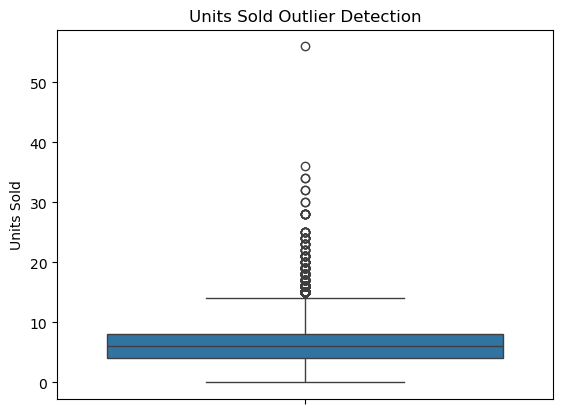

In [74]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

#######################################################
# Data Wrangling

# Step 1: Load the dataset
df = pd.read_csv('Retail_sales.csv')

#Display info
print("\nInformation About Data:")
print(df.info())
print("\nFirst 5 observations of the dataset:")
print(df.head())
print("\nLast 5 observations of the dataset:")
print(df.tail())
print("\nStatistics Summary of Data:")
print(df.describe())
print("\nCheck for Duplication:")
print(df.nunique())

# Step 2: Check for missing values
print("\nNumber of missing records in each column")
print(df.isnull().sum())

# Drop rows with missing values
df = df.dropna()

# Step 3: Check for duplicate rows
df = df.drop_duplicates()

# Step 4: Convert 'Date' to datetime format
df['Date'] = pd.to_datetime(df['Date'])

# Step 5: One-hot encode categorical variables
#df_encoded = pd.get_dummies(df, columns=['Store Location', 'Product Category', 'Day of the Week'])

##
# Check data types
print("\nData Types:")
print(df.dtypes)
# Select columns with object (categorical) data types
categorical_cols = df.select_dtypes(include=['object']).columns

# Apply one-hot encoding to all categorical columns
df_encoded = pd.get_dummies(df, columns=categorical_cols)

# View the first few rows of the encoded DataFrame
#print(df_encoded.head())

##
# Step 6: Outlier detection
sns.boxplot(df['Units Sold'])
plt.title('Units Sold Outlier Detection')
plt.show()

# Step 7: Extract new features from 'Date'
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day

# Step 8: Save the cleaned data
df.to_csv('Retail_sales_cleaned.csv', index=False)

#####################################################

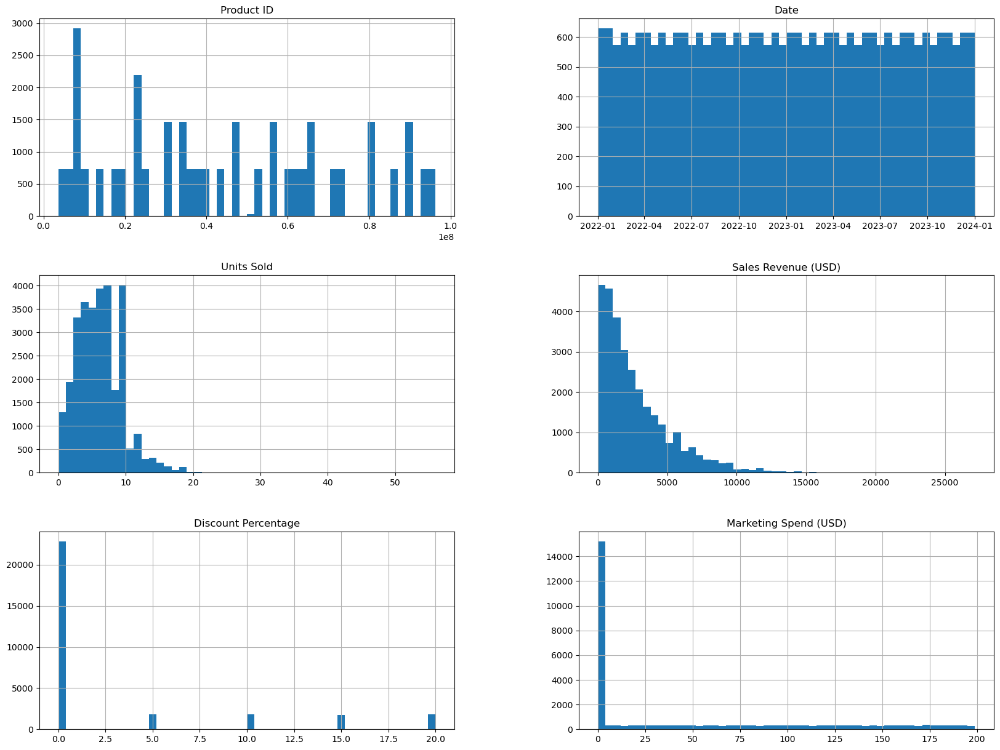

In [76]:
# EDA: Univariate Analysis
df_encoded.hist(bins=50, figsize=(20, 15))
plt.savefig('all.png', dpi=300)
plt.show()

#################################################

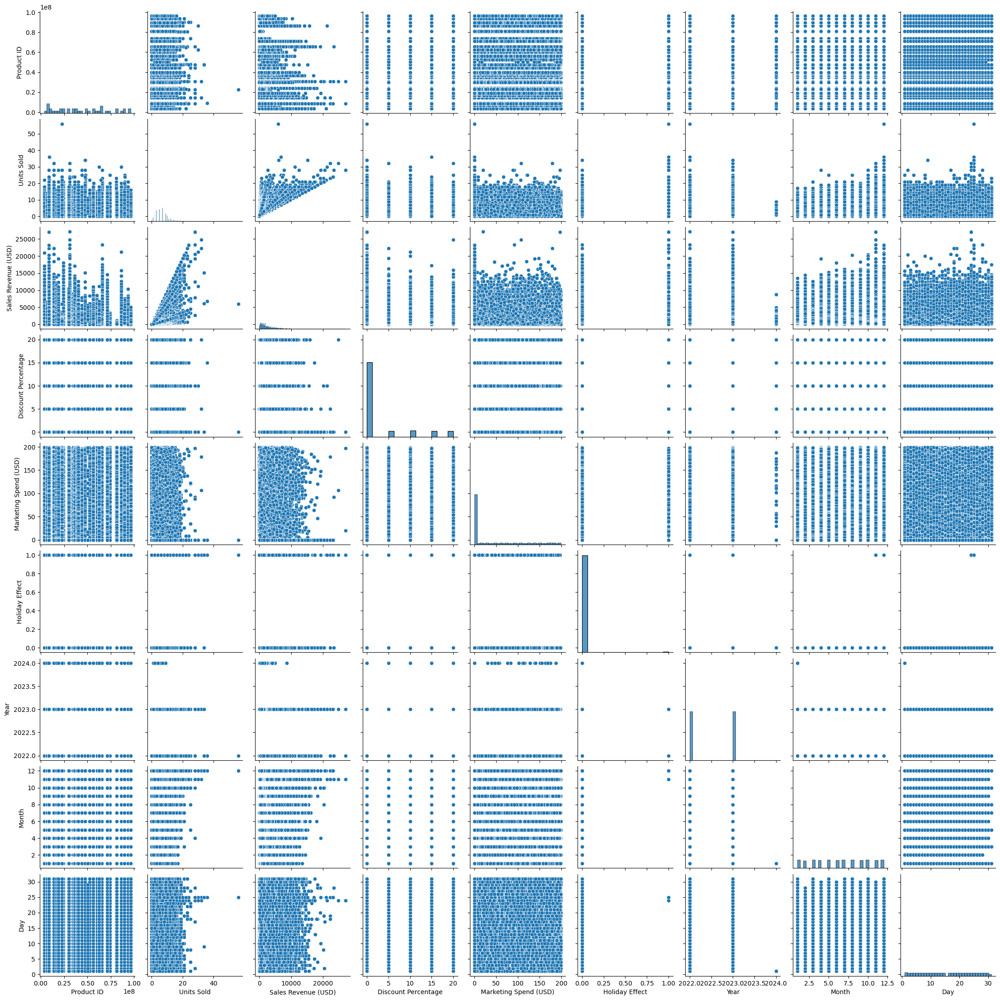

In [18]:
sns.pairplot(df)
plt.show()

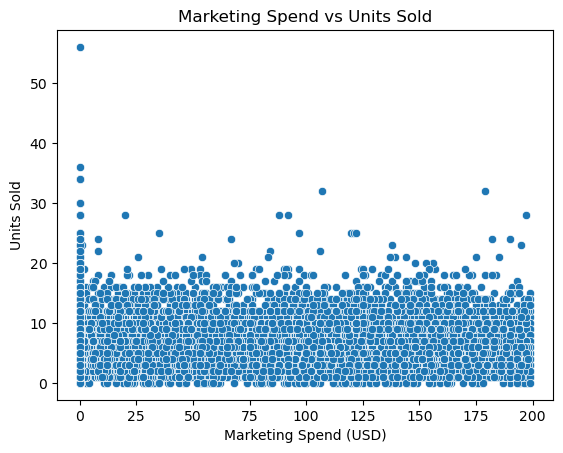

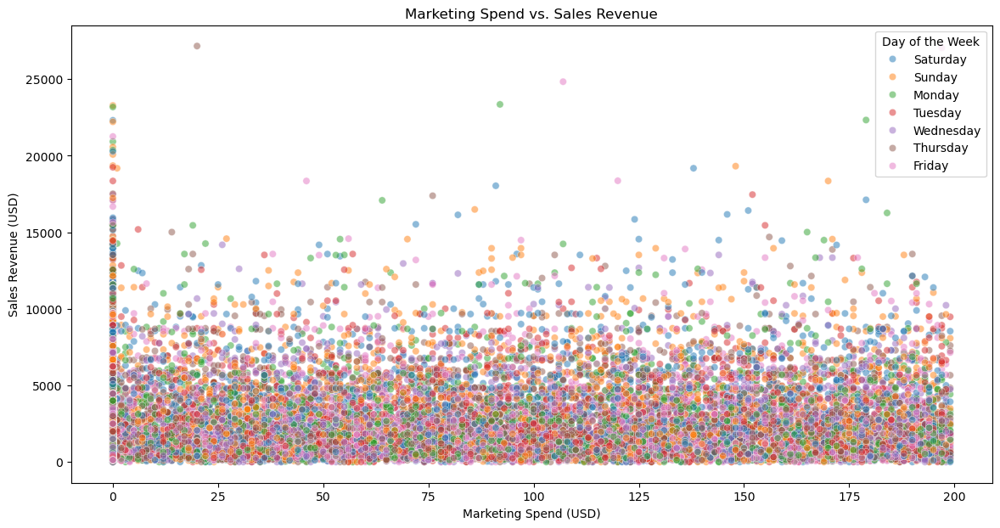

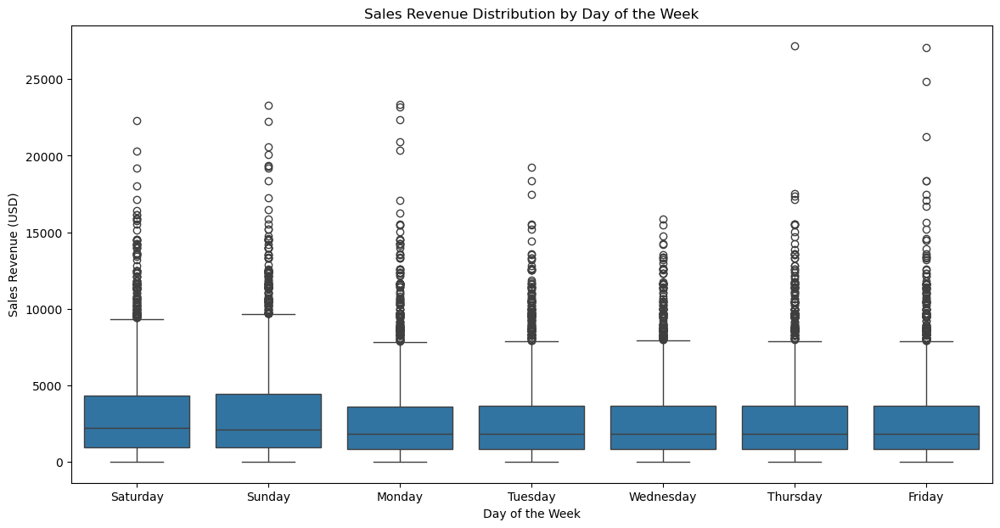

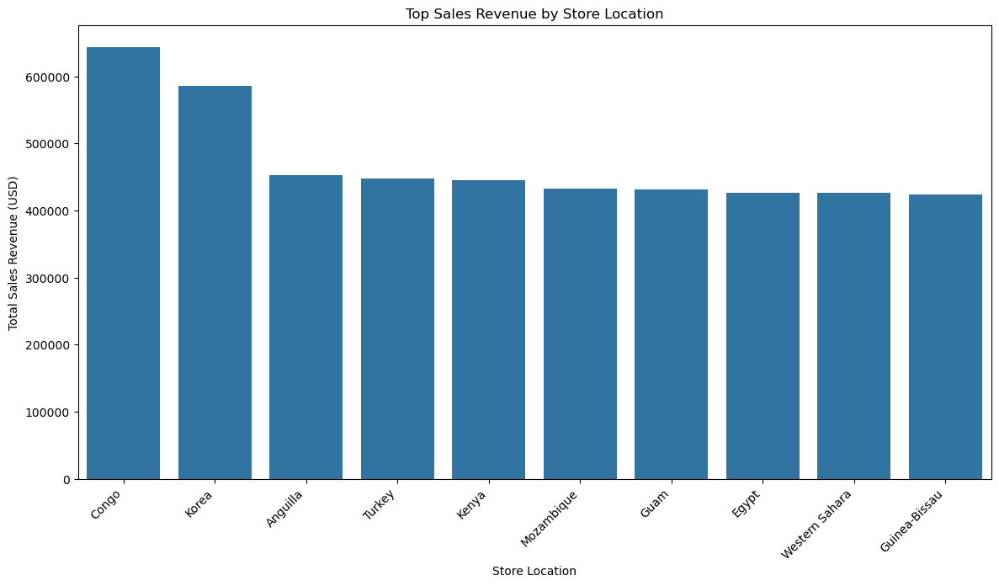

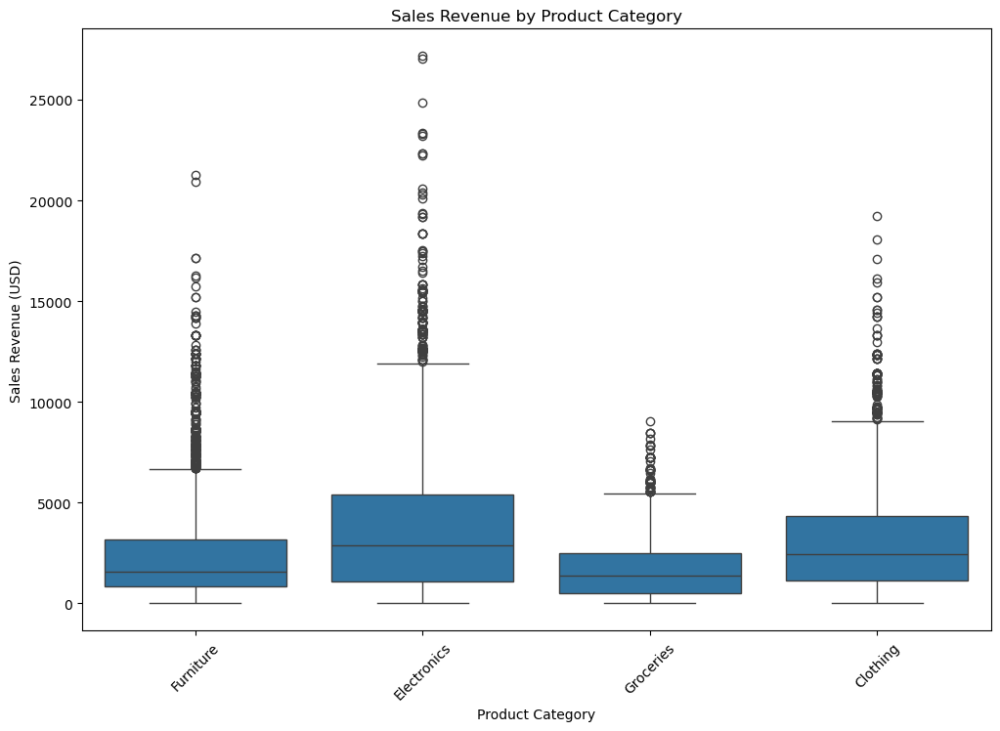

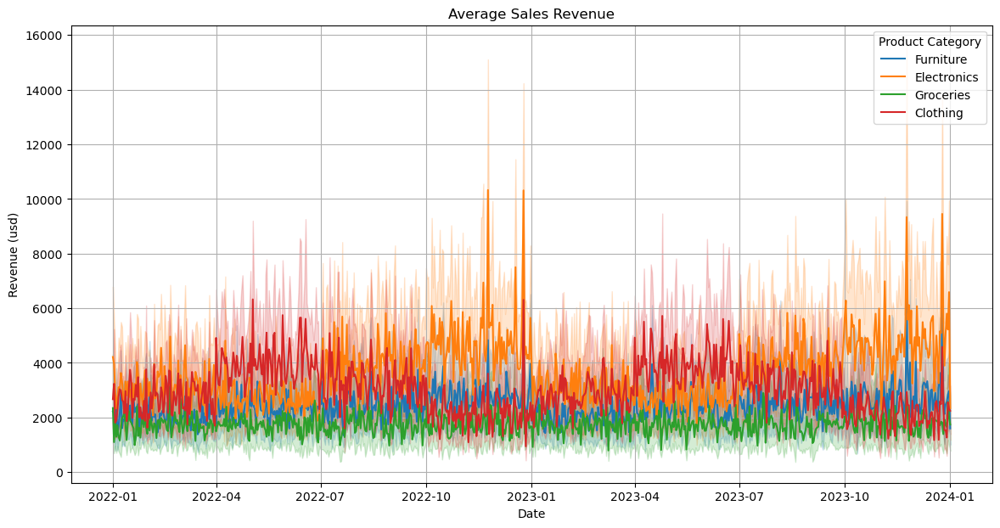

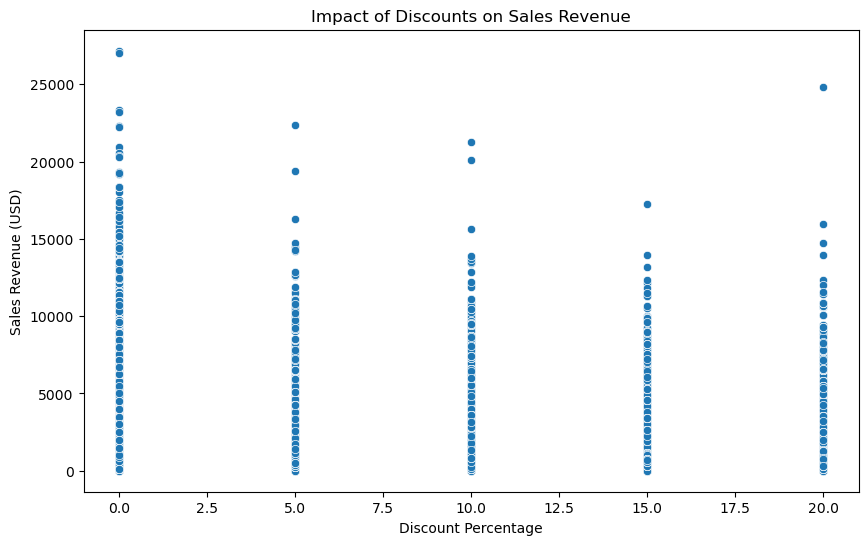

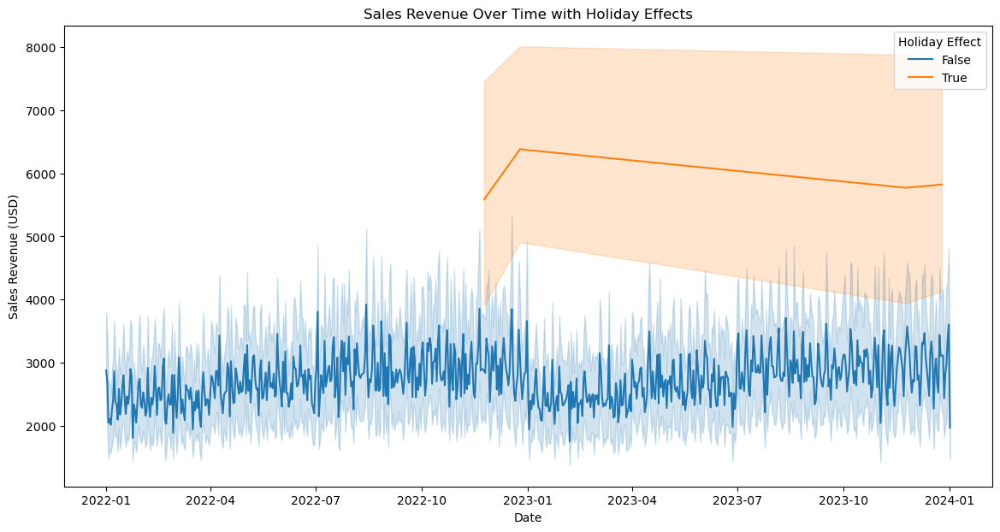

In [78]:
# Bivariate Analysis
sns.scatterplot(x='Marketing Spend (USD)', y='Units Sold', data=df_encoded)
plt.title('Marketing Spend vs Units Sold')
plt.savefig('spendVSunits.png', dpi=300)
plt.savefig('spendbyunitssold.png', dpi=300)
plt.show()

# Marketing Spend vs. Sales Revenue
plt.figure(figsize=(14, 7))
sns.scatterplot(data=df, x='Marketing Spend (USD)', y='Sales Revenue (USD)', alpha=0.5, hue='Day of the Week')
plt.title('Marketing Spend vs. Sales Revenue')
plt.xlabel('Marketing Spend (USD)')
plt.ylabel('Sales Revenue (USD)')
plt.savefig('revenuebyspend.png', dpi=300)
plt.show()

# Example plot (Already done as a group)
#sns.histplot(df['Units Sold'], bins=50)
#plt.title('Distribution of Units Sold')
#plt.savefig('units_sold_distribution.png', dpi=300)  # Adjust dpi for resolution
#plt.show()

# Save the figure as a PNG file
plt.figure(figsize=(14, 7))
sns.boxplot(data=df, x='Day of the Week', y='Sales Revenue (USD)')
plt.title('Sales Revenue Distribution by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Sales Revenue (USD)')
#plt.xticks(rotation=45)
plt.savefig('revenuebyweekday.png', dpi=300)
plt.show()

# Aggregate sales revenue by store location
store_revenue = df.groupby('Store Location')['Sales Revenue (USD)'].sum()

# Sort the values and select the top N store locations
top_n = 10  # Number of top store locations to display
top_store_revenue = store_revenue.sort_values(ascending=False).head(top_n)

# Create the bar plot
plt.figure(figsize=(14, 7))
sns.barplot(x=top_store_revenue.index, y=top_store_revenue.values)
plt.title('Top Sales Revenue by Store Location')
plt.xlabel('Store Location')
plt.ylabel('Total Sales Revenue (USD)')
plt.xticks(rotation=45, ha='right')  # Adjust rotation and alignment
plt.savefig('revenuebylocation.png', dpi=300)
plt.show()


#Sales Revenue by Product Category

plt.figure(figsize=(12, 8))
sns.boxplot(x='Product Category', y='Sales Revenue (USD)', data=df)
plt.title('Sales Revenue by Product Category')
plt.xlabel('Product Category')
plt.ylabel('Sales Revenue (USD)')
plt.xticks(rotation=45)
plt.savefig('revenuebyproduct.png', dpi=300)
plt.show()

plt.figure(figsize=(14,7))
sns.lineplot(data=df,x='Date',y='Sales Revenue (USD)', hue = 'Product Category',estimator='mean',palette='tab10')
plt.title('Average Sales Revenue')
plt.xlabel('Date')
plt.ylabel('Revenue (usd)')
plt.grid(True)
plt.savefig('revenueproductdate.png', dpi=300)
plt.show()

#Impact of Discounts on Sales Revenue
plt.figure(figsize=(10, 6))
#sns.boxplot(x='Discount Percentage', y='Sales Revenue (USD)', data=df_encoded)
sns.scatterplot(x='Discount Percentage', y='Sales Revenue (USD)', data=df_encoded)
plt.title('Impact of Discounts on Sales Revenue')
plt.xlabel('Discount Percentage')
plt.ylabel('Sales Revenue (USD)')
plt.savefig('revenuediscount.png', dpi=300)
plt.show()

#Sales revenue over time with holiday effect
plt.figure(figsize=(14, 7))
sns.lineplot(x='Date', y='Sales Revenue (USD)', hue='Holiday Effect', data=df)
plt.title('Sales Revenue Over Time with Holiday Effects')
plt.xlabel('Date')
plt.ylabel('Sales Revenue (USD)')
plt.legend(title='Holiday Effect')
plt.savefig('revenueholiday.png', dpi=300)
plt.show()


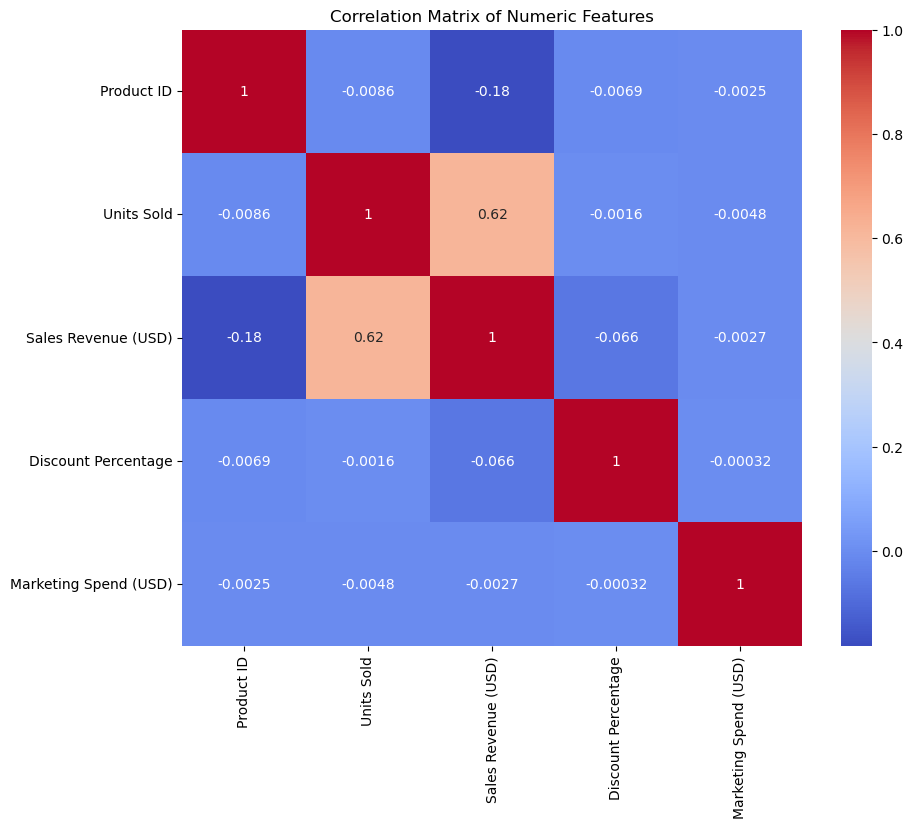

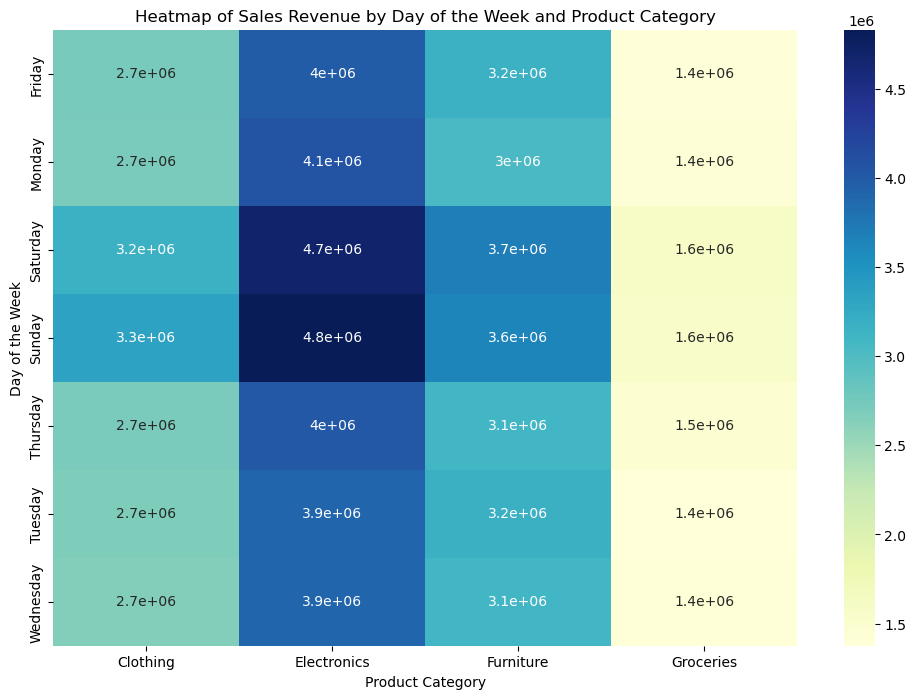

In [79]:


##################################################################
#Multivariate Analysis
# Select only numeric columns
numeric_df = df_encoded.select_dtypes(include=['number'])

# Calculate correlation matrix on numeric columns
corr_matrix = numeric_df.corr()

# Plot the correlation matrix

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Numeric Features')
plt.savefig('corr_matrix.png', dpi=300)
plt.show()

#Heatmap of Sales Revenue by Day of the Week and Product Category
plt.figure(figsize=(12, 8))
heatmap_data = df.pivot_table(index='Day of the Week', columns='Product Category', values='Sales Revenue (USD)', aggfunc='sum')
sns.heatmap(heatmap_data, annot=True, cmap='YlGnBu')
plt.title('Heatmap of Sales Revenue by Day of the Week and Product Category')
plt.savefig('salesweekproduct.png', dpi=300)
plt.show()


In [95]:
# Necessary imports

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.linear_model import LinearRegression, SGDRegressor, ElasticNet
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, BaggingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor


####################################################################################
## Machine Learning

# Define features and target variable
X = df[['Product ID','Store Location', 'Product Category', 'Units Sold', 'Day of the Week',
        'Discount Percentage', 'Marketing Spend (USD)', 'Holiday Effect']]
y = df['Sales Revenue (USD)']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

categorical_cols = ['Product ID', 'Store Location', 'Product Category', 'Day of the Week']
numerical_cols = ['Units Sold', 'Discount Percentage', 'Marketing Spend (USD)'] 
boolean_cols = ['Holiday Effect']

# Define your preprocessing step
preprocessor = ColumnTransformer(
    transformers=[
        ('num', MinMaxScaler(), numerical_cols),
        ('bool', 'passthrough', boolean_cols),
        ('cat', OneHotEncoder(), categorical_cols)
    ])


#####################################################################
# Define features and target variable
#X = df[['Units Sold', 'Discount Percentage', 'Marketing Spend (USD)', 'Holiday Effect']]
#y = df['Sales Revenue (USD)']

# Ensure all required columns are present
#if all(col in df.columns for col in ['Units Sold', 'Discount Percentage', 'Marketing Spend (USD)', 'Holiday Effect']):
#    X = df[['Units Sold', 'Discount Percentage', 'Marketing Spend (USD)', 'Holiday Effect']]
#    y = df['Sales Revenue (USD)']
#else:
#    raise ValueError("Missing required columns in the dataset.")

# Split the data
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Preprocessing pipeline
#preprocessor = ColumnTransformer(
#    transformers=[
#        ('num', Pipeline(steps=[('imputer', SimpleImputer(strategy='median')), 
#                                ('scaler', MinMaxScaler())]), ['Units Sold', 'Discount Percentage', 'Marketing Spend (USD)']),
#        ('bool', 'passthrough', ['Holiday Effect'])
#    ])
################################################################
# Initialize results list
results = []

# Function to evaluate models
def evaluate_model(model, X_train, y_train, X_test, y_test, model_name):
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('model', model)
    ])
    
    pipeline.fit(X_train, y_train)
    y_pred_test = pipeline.predict(X_test)
    test_r2 = r2_score(y_test, y_pred_test)
    test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
    print(f"{model_name} Model:")
    print(f"Test R²: {test_r2:.4f}")
    print(f"Test RMSE: {test_rmse:.4f}\n")
    results.append({'Model': model_name, 'R²': test_r2, 'RMSE': test_rmse})

# Define models
models = {
    'Linear Regression': LinearRegression(),
    'SGD Regressor': SGDRegressor(),
    'Random Forest': RandomForestRegressor(),
    'ElasticNet': ElasticNet(),
    'K-Neighbors Regressor': KNeighborsRegressor(),
    'Decision Tree': DecisionTreeRegressor(),
    'SVR': SVR(),
    'XGBoost': XGBRegressor(),
    'Gradient Boosting': GradientBoostingRegressor(),
    'Bagging': BaggingRegressor()
}

# Evaluate models
for model_name, model in models.items():
    evaluate_model(model, X_train, y_train, X_test, y_test, model_name)

# Results DataFrame
results_df = pd.DataFrame(results)
print(results_df)


Linear Regression Model:
Test R²: 0.8629
Test RMSE: 959.3323

SGD Regressor Model:
Test R²: 0.8622
Test RMSE: 961.5560

Random Forest Model:
Test R²: 0.9965
Test RMSE: 153.5433

ElasticNet Model:
Test R²: 0.0894
Test RMSE: 2471.9898

K-Neighbors Regressor Model:
Test R²: 0.7790
Test RMSE: 1217.7166

Decision Tree Model:
Test R²: 0.9967
Test RMSE: 149.6825

SVR Model:
Test R²: -0.0478
Test RMSE: 2651.6621

XGBoost Model:
Test R²: 0.9981
Test RMSE: 113.9861

Gradient Boosting Model:
Test R²: 0.8913
Test RMSE: 853.9157

Bagging Model:
Test R²: 0.9965
Test RMSE: 152.5746

                   Model        R²         RMSE
0      Linear Regression  0.862854   959.332302
1          SGD Regressor  0.862217   961.556037
2          Random Forest  0.996487   153.543349
3             ElasticNet  0.089376  2471.989846
4  K-Neighbors Regressor  0.779028  1217.716641
5          Decision Tree  0.996661   149.682489
6                    SVR -0.047809  2651.662147
7                XGBoost  0.998064   113.

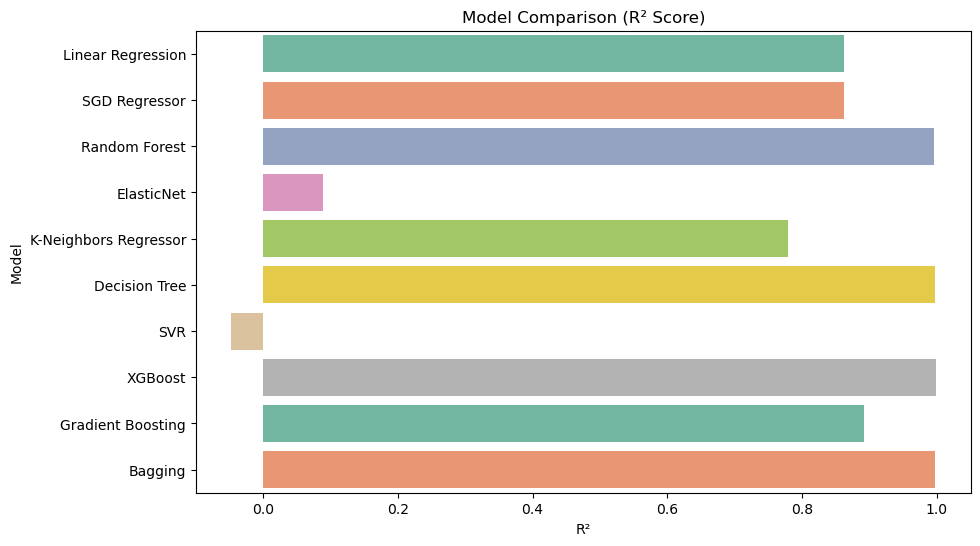

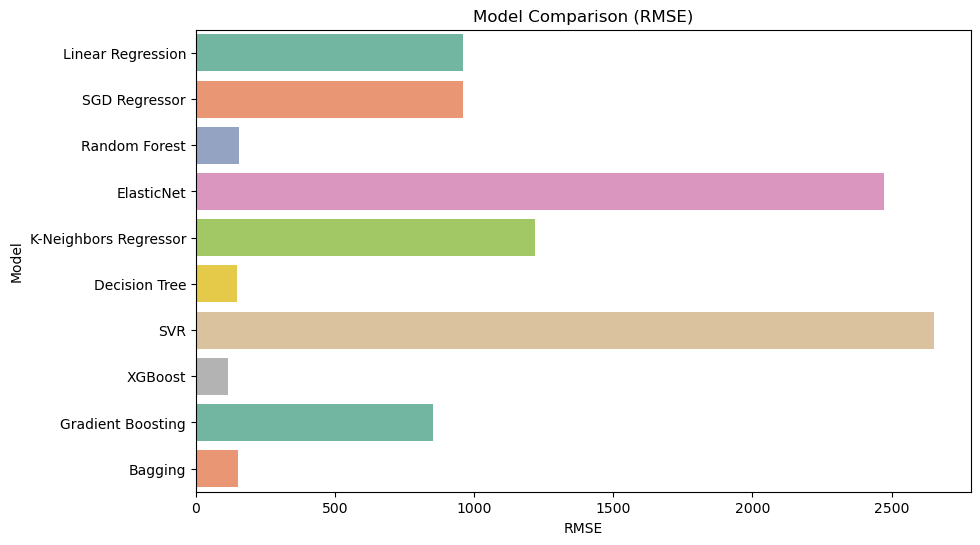

In [96]:
# Define a custom color palette
custom_palette = sns.color_palette("Set2")  # You can change "Set2" to any other seaborn palette

# Plot R² comparison
plt.figure(figsize=(10, 6))
sns.barplot(x='R²', y='Model', data=results_df, palette=custom_palette)
plt.title('Model Comparison (R² Score)')
plt.show()

# Plot RMSE comparison
plt.figure(figsize=(10, 6))
sns.barplot(x='RMSE', y='Model', data=results_df, palette=custom_palette)
plt.title('Model Comparison (RMSE)')
plt.show()

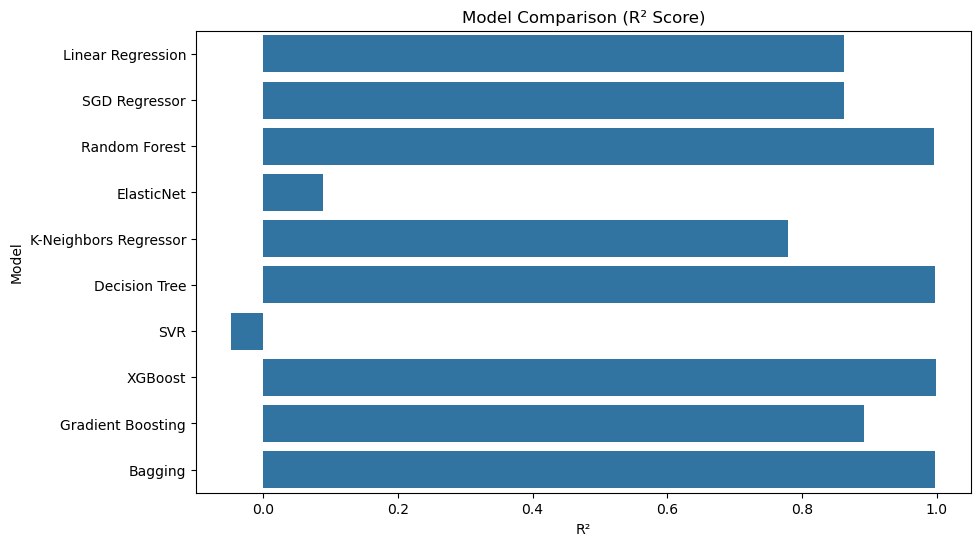

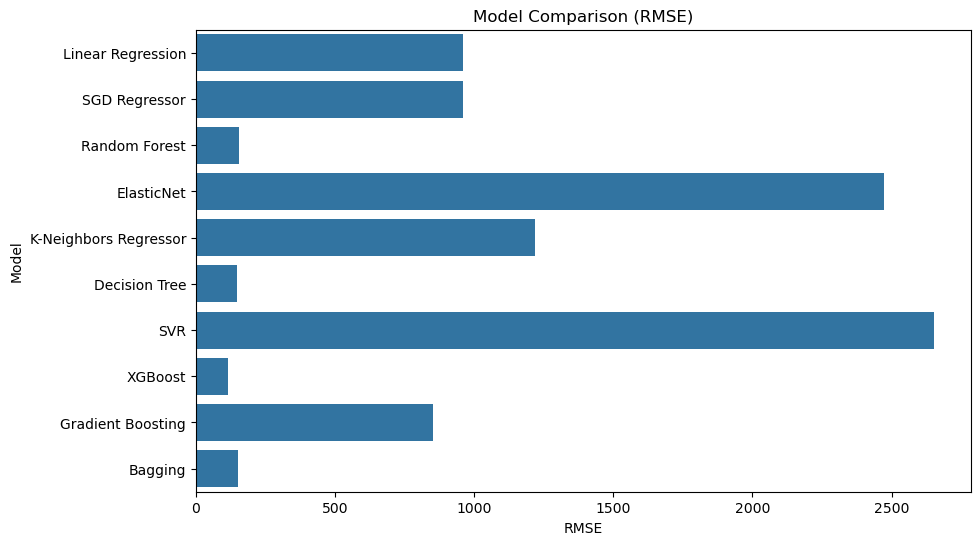

In [97]:
# Plot R² comparison
plt.figure(figsize=(10, 6))
sns.barplot(x='R²', y='Model', data=results_df)  # Removed the palette argument
plt.title('Model Comparison (R² Score)')
plt.show()

# Plot RMSE comparison
plt.figure(figsize=(10, 6))
sns.barplot(x='RMSE', y='Model', data=results_df)  # Removed the palette argument
plt.title('Model Comparison (RMSE)')
plt.show()


Mean Absolute Error (MAE): 24.901667200002077
Mean Squared Error (MSE): 45049.48009065349
Root Mean Squared Error (RMSE): 212.24862800652795
R-squared (R2): 0.9932867112529398


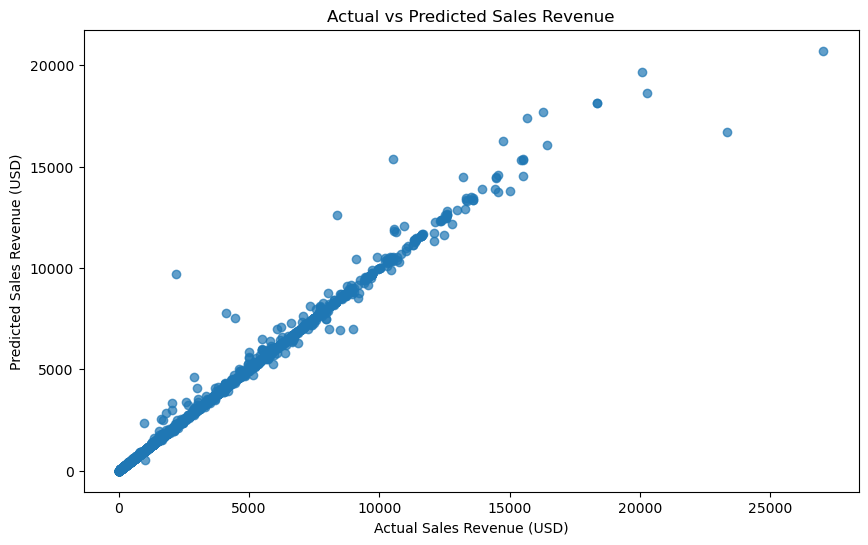

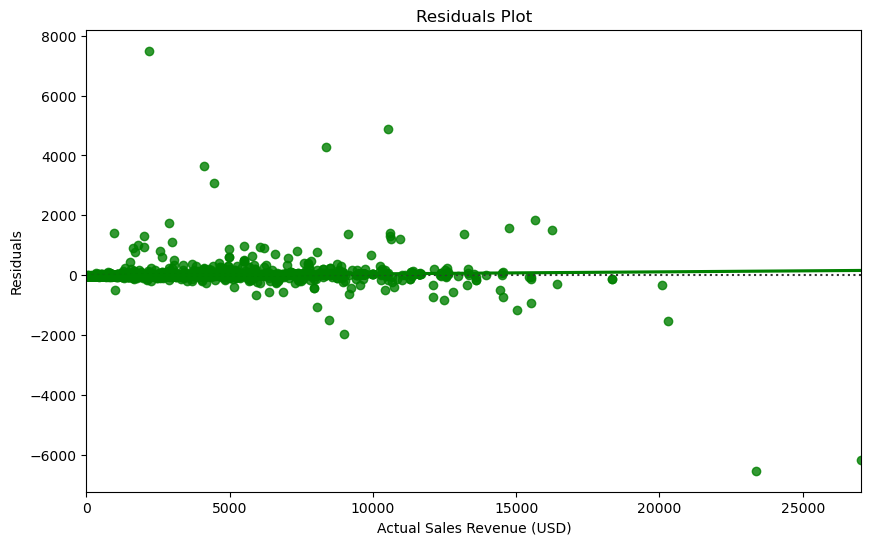

In [82]:
#Regression 1
#df['Date'] = pd.to_datetime(df['Date'])

#df = pd.get_dummies(df, columns=['Store ID', 'Store Location', 'Product Category', 'Day of the Week'], drop_first=True)

#X = df.drop(columns=['Sales Revenue (USD)', 'Date'])
#y = df['Sales Revenue (USD)']

#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#Model
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


rf = RandomForestRegressor(random_state=42)
rf.fit(X_train_scaled, y_train)
y_pred = rf.predict(X_test_scaled)

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
print(f'Mean Absolute Error (MAE): {mae}')
print(f'Mean Squared Error (MSE): {mse}')
print(f'Root Mean Squared Error (RMSE): {rmse}')
print(f'R-squared (R2): {r2}')

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.7)
plt.xlabel('Actual Sales Revenue (USD)')
plt.ylabel('Predicted Sales Revenue (USD)')
plt.title('Actual vs Predicted Sales Revenue')
plt.show()

# Residual plot
plt.figure(figsize=(10, 6))
sns.residplot(x=y_test, y=y_pred, lowess=True, color='g')
plt.xlabel('Actual Sales Revenue (USD)')
plt.ylabel('Residuals')
plt.title('Residuals Plot')
plt.show()
####################################################################################

Linear Regression Model:
Test R²: 0.5417
Test RMSE: 1753.7249

SGD Regressor Model:
Test R²: 0.5425
Test RMSE: 1752.1497

Random Forest Model:
Test R²: 0.4694
Test RMSE: 1887.0014

ElasticNet Model:
Test R²: 0.0846
Test RMSE: 2478.4418

K-Neighbors Regressor Model:
Test R²: 0.4416
Test RMSE: 1935.7042

Decision Tree Model:
Test R²: 0.2184
Test RMSE: 2290.1268

SVR Model:
Test R²: -0.0495
Test RMSE: 2653.7860

XGBoost Model:
Test R²: 0.5330
Test RMSE: 1770.1885

Gradient Boosting Model:
Test R²: 0.5043
Test RMSE: 1823.7729

Bagging Model:
Test R²: 0.4476
Test RMSE: 1925.2666



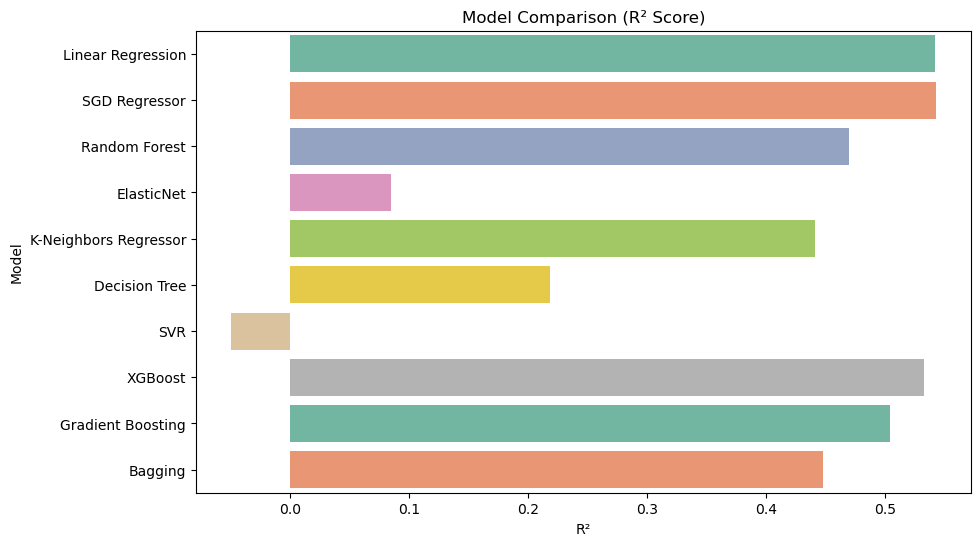

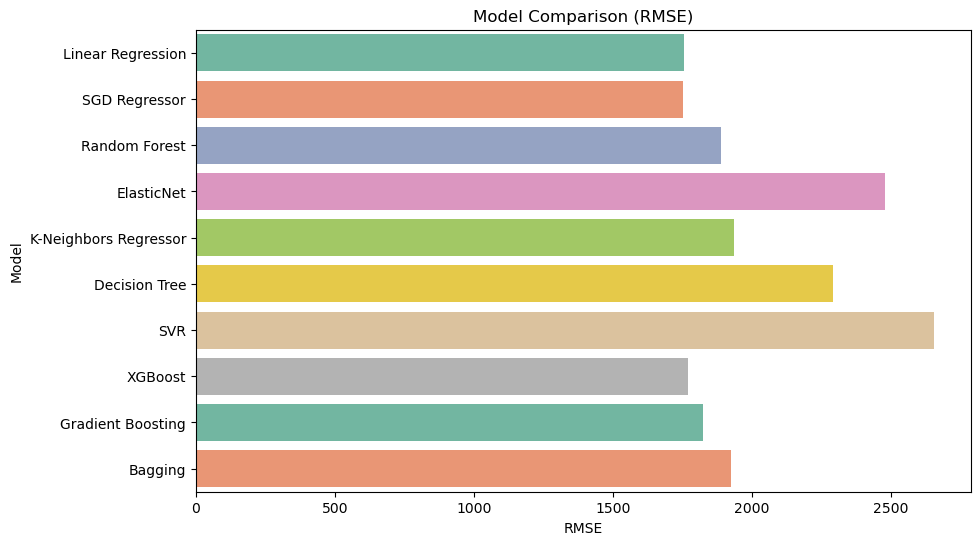

In [90]:
#Fighting Data Leakage

# Define target variable
#y = df['Sales Revenue (USD)']

# Define correct features without Items Sold to avoid leakage
X = df[['Product ID','Store Location', 'Product Category', 'Day of the Week','Discount Percentage', 'Marketing Spend (USD)', 'Holiday Effect']]

# Define columns correctly
categorical_cols = ['Product ID', 'Store Location', 'Product Category', 'Day of the Week']
numerical_cols = ['Discount Percentage', 'Marketing Spend (USD)']
boolean_cols = ['Holiday Effect']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Preprocessing
preprocessor = ColumnTransformer(
    transformers=[
        ('num', MinMaxScaler(), numerical_cols),
        ('bool', 'passthrough', boolean_cols),
        ('cat', OneHotEncoder(), categorical_cols)
    ])

# Initialize list to collect results
results = []

# Evaluation function
def evaluate_model(model, X_train, y_train, X_test, y_test, model_name):
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('model', model)
    ])
    pipeline.fit(X_train, y_train)
    
    y_pred_test = pipeline.predict(X_test)
    
    test_r2 = r2_score(y_test, y_pred_test)
    test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))

    print(f"{model_name} Model:")
    print(f"Test R²: {test_r2:.4f}")
    print(f"Test RMSE: {test_rmse:.4f}\n")
    
    results.append({'Model': model_name, 'R²': test_r2, 'RMSE': test_rmse})

# Define models
models = {
    'Linear Regression': LinearRegression(),
    'SGD Regressor': SGDRegressor(),
    'Random Forest': RandomForestRegressor(),
    'ElasticNet': ElasticNet(),
    'K-Neighbors Regressor': KNeighborsRegressor(),
    'Decision Tree': DecisionTreeRegressor(),
    'SVR': SVR(),
    'XGBoost': XGBRegressor(),
    'Gradient Boosting': GradientBoostingRegressor(),
    'Bagging': BaggingRegressor()
}

# Model Evaluation
for model_name, model in models.items():
    evaluate_model(model, X_train, y_train, X_test, y_test, model_name)

# Results DataFrame
results_df = pd.DataFrame(results)
print(results_df)

# Define color palette
custom_palette = sns.color_palette("Set2")

# Plot R² comparison
plt.figure(figsize=(10, 6))
sns.barplot(x='R²', y='Model', data=results_df, palette=custom_palette)
plt.title('Model Comparison (R² Score)')
plt.show()

# Plot RMSE comparison
plt.figure(figsize=(10, 6))
sns.barplot(x='RMSE', y='Model', data=results_df, palette=custom_palette)
plt.title('Model Comparison (RMSE)')
plt.show()


In [22]:
# Necessary imports
from scipy.stats import entropy

# Function to calculate entropy from residuals
def calculate_entropy(residuals):
    hist, bin_edges = np.histogram(residuals, bins=10, density=True)
    return entropy(hist, base=2)  # Use base-2 entropy

# Example dataframe creation (replace this with your actual DataFrame)
df = pd.read_csv('Retail_sales_cleaned.csv')

# Define features and target variable
X = df[['Product ID','Store Location', 'Product Category', 'Day of the Week', 'Discount Percentage', 'Marketing Spend (USD)', 'Holiday Effect']]
y = df['Sales Revenue (USD)']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define preprocessing steps
categorical_cols = ['Product ID', 'Store Location', 'Product Category', 'Day of the Week']
numerical_cols = ['Discount Percentage', 'Marketing Spend (USD)']
boolean_cols = ['Holiday Effect']

# Preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('num', MinMaxScaler(), numerical_cols),
        ('bool', 'passthrough', boolean_cols),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols)
    ])

# Initialize list to collect results
results = []

# Evaluation function with entropy
def evaluate_model(model, X_train, y_train, X_test, y_test, model_name):
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('model', model)
    ])
    
    pipeline.fit(X_train, y_train)
    
    # Make predictions and calculate residuals
    y_pred_test = pipeline.predict(X_test)
    residuals = y_test - y_pred_test
    
    # Calculate metrics: R², RMSE, and entropy
    test_r2 = r2_score(y_test, y_pred_test)
    test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
    residual_entropy = calculate_entropy(residuals)
    
    # Print and append results
    print(f"{model_name} Model:")
    print(f"Test R²: {test_r2:.4f}")
    print(f"Test RMSE: {test_rmse:.4f}")
    print(f"Residual Entropy: {residual_entropy:.4f}\n")
    
    results.append({
        'Model': model_name, 
        'R²': test_r2, 
        'RMSE': test_rmse, 
        'Entropy': residual_entropy
    })

# Define models to evaluate
models = {
    'Linear Regression': LinearRegression(),
    'SGD Regressor': SGDRegressor(),
    'Random Forest': RandomForestRegressor(),
    'ElasticNet': ElasticNet(),
    'K-Neighbors Regressor': KNeighborsRegressor(),
    'Decision Tree': DecisionTreeRegressor(),
    'SVR': SVR(),
    'XGBoost': XGBRegressor(),
    'Gradient Boosting': GradientBoostingRegressor(),
    'Bagging': BaggingRegressor()
}

# Iterate over models and evaluate
for model_name, model in models.items():
    evaluate_model(model, X_train, y_train, X_test, y_test, model_name)

# Convert results to DataFrame for visualization
results_df = pd.DataFrame(results)


Linear Regression Model:
Test R²: 0.5417
Test RMSE: 1753.7249
Residual Entropy: 1.4910

SGD Regressor Model:
Test R²: 0.5427
Test RMSE: 1751.7008
Residual Entropy: 1.4901

Random Forest Model:
Test R²: 0.4703
Test RMSE: 1885.3550
Residual Entropy: 1.4737

ElasticNet Model:
Test R²: 0.0846
Test RMSE: 2478.4418
Residual Entropy: 1.6234

K-Neighbors Regressor Model:
Test R²: 0.4416
Test RMSE: 1935.7042
Residual Entropy: 1.4593

Decision Tree Model:
Test R²: 0.2254
Test RMSE: 2279.9670
Residual Entropy: 1.4749

SVR Model:
Test R²: -0.0495
Test RMSE: 2653.7860
Residual Entropy: 1.5521

XGBoost Model:
Test R²: 0.5330
Test RMSE: 1770.1885
Residual Entropy: 1.4143

Gradient Boosting Model:
Test R²: 0.5042
Test RMSE: 1824.0616
Residual Entropy: 1.7147

Bagging Model:
Test R²: 0.4542
Test RMSE: 1913.8335
Residual Entropy: 1.3276



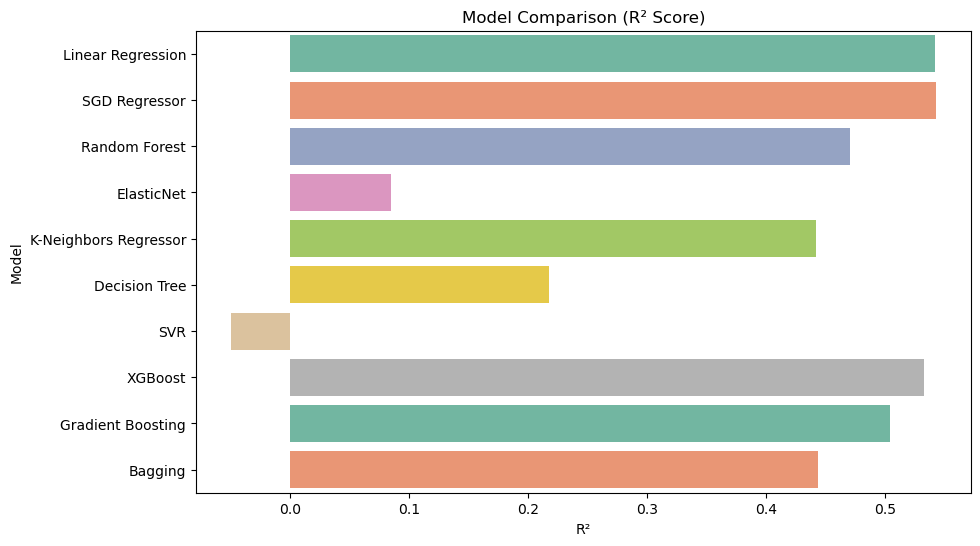

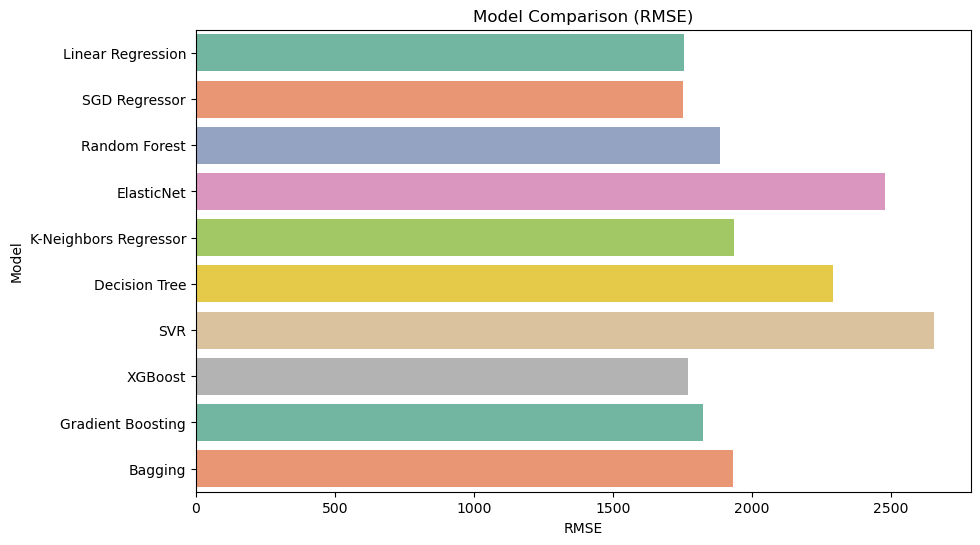

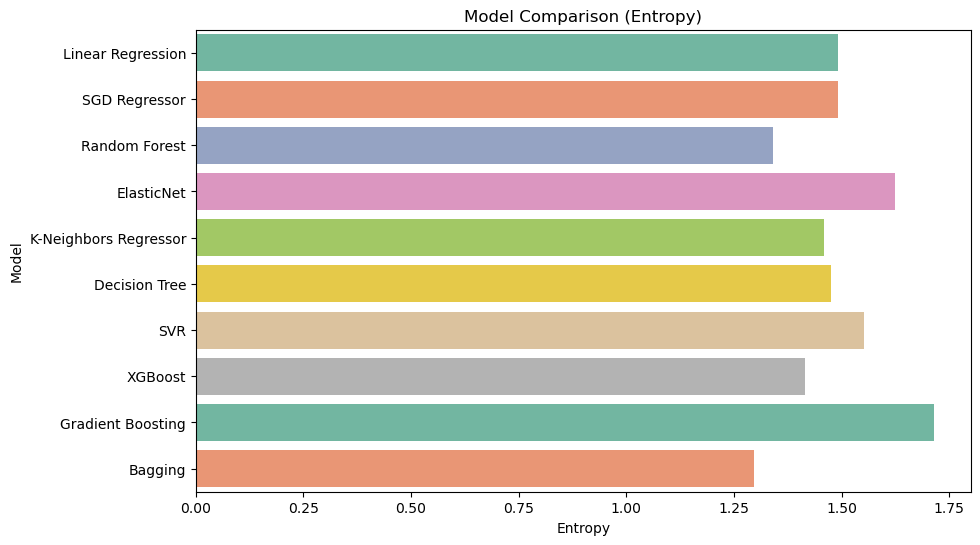

In [20]:
# Define a custom color palette with enough colors for all models
custom_palette = sns.color_palette("Set2", 10)  # Set to 10 for the 10 models

# Plot R² comparison with hue assignment to Model
plt.figure(figsize=(10, 6))
sns.barplot(x='R²', y='Model', data=results_df, hue='Model', palette=custom_palette, dodge=False, legend=False)
plt.title('Model Comparison (R² Score)')
plt.show()

# Plot RMSE comparison with hue assignment to Model
plt.figure(figsize=(10, 6))
sns.barplot(x='RMSE', y='Model', data=results_df, hue='Model', palette=custom_palette, dodge=False, legend=False)
plt.title('Model Comparison (RMSE)')
plt.show()

# Plot Entropy comparison with hue assignment to Model
plt.figure(figsize=(10, 6))
sns.barplot(x='Entropy', y='Model', data=results_df, hue='Model', palette=custom_palette, dodge=False, legend=False)
plt.title('Model Comparison (Entropy)')
plt.show()

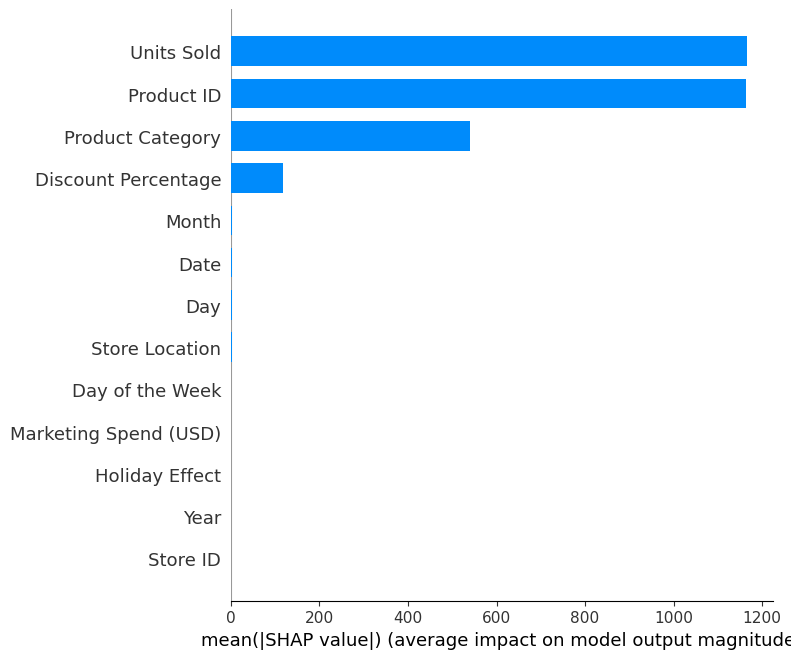

<Figure size 640x480 with 0 Axes>

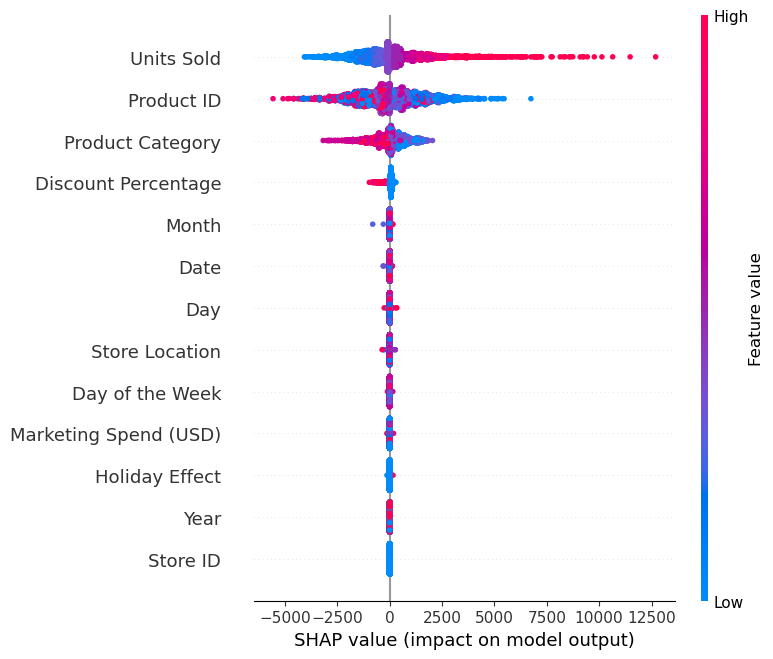

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

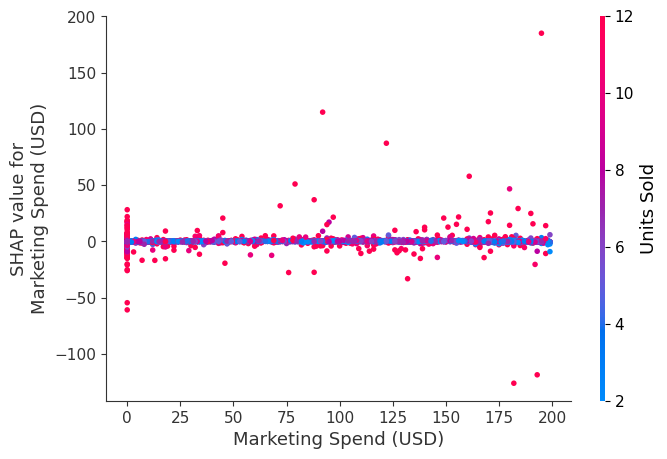

<Figure size 640x480 with 0 Axes>

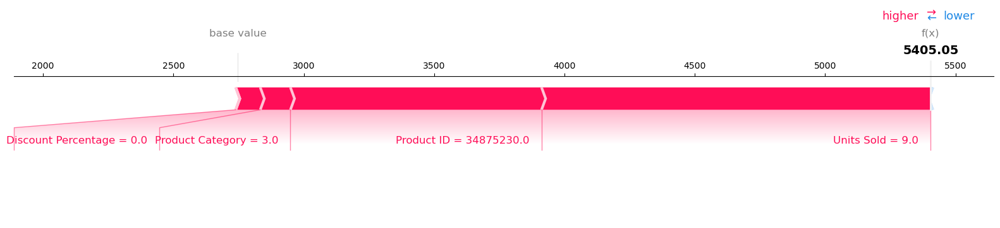

In [14]:
import pandas as pd
import shap
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import LabelEncoder

# Load and preprocess the data
df = pd.read_csv('retail_sales_cleaned.csv')  # Replace with the actual path to your dataset
df = df.dropna()  # Drop rows with missing values

# Encode categorical variables using LabelEncoder
le = LabelEncoder()
for col in df.select_dtypes(include=['object']).columns:
    df[col] = le.fit_transform(df[col])

# Split data into features and target
X = df.drop("Sales Revenue (USD)", axis=1)
y = df["Sales Revenue (USD)"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a RandomForestRegressor model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Initialize SHAP TreeExplainer (optimized for tree-based models)
explainer = shap.TreeExplainer(model)

# Calculate SHAP values for the test set
shap_values = explainer.shap_values(X_test)

# 1. Global Feature Importance: SHAP Summary Plot - visualizes which features are most important globally
plt.figure()
shap.summary_plot(shap_values, X_test, plot_type="bar")
plt.savefig('SHAP1_Summary.png', dpi=300)
plt.show()

# 2. Feature Impact Visualization: SHAP Summary Plot with Beeswarm
plt.figure()
shap.summary_plot(shap_values, X_test)
plt.savefig('SHAP2_Beeswarm.png', dpi=300)
plt.show()

# 3. Dependence Plot for a specific feature
# Replace 'Marketing Spend (USD)' with a relevant feature in your dataset
# shows how "Marketing Spend (USD)" impacts predictions across different instances.
plt.figure()
shap.dependence_plot("Marketing Spend (USD)", shap_values, X_test)
plt.savefig('SHAP3_Marketing.png', dpi=300)
plt.show()
#shap.dependence_plot(("Marketing Spend (USD)", "Discount Percentage"), shap_values, X_test)
##############################
#other tests
# Loop through each feature to create a dependence plot
#for feature in X_test.columns:
#    shap.dependence_plot(feature, shap_values, X_test)
# Generate and save dependence plots for each feature
#    plt.savefig(f'shap_dependence_{feature}.png')  # Save plot with the feature name
    #plt.savefig('imagename.png', dpi=300)#dont use
#    plt.close()  # Close the plot to avoid overlapping in the loop
#########################

# 4. Individual Prediction Explanation
# Select a specific sample (e.g., the first instance in X_test)
#provides a breakdown of how each feature in a specific sample contributed to its prediction
sample_index = 0  # Index of the sample to explain
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[sample_index], X_test.iloc[sample_index, :], matplotlib=True)


In [19]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import LabelEncoder
from lime import lime_tabular

import warnings
warnings.filterwarnings("ignore", category=UserWarning, module="sklearn")

# Load dataset
df = pd.read_csv('retail_sales.csv')  # Replace with your file path

# Basic preprocessing
df = df.dropna()  # Drop rows with missing values
le = LabelEncoder()
for col in df.select_dtypes(include=['object']).columns:
    df[col] = le.fit_transform(df[col])  # Encode categorical variables

# Separate features and target variable
X = df.drop("Sales Revenue (USD)", axis=1)
y = df["Sales Revenue (USD)"]

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a RandomForestRegressor
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Initialize LIME Tabular Explainer
explainer = lime_tabular.LimeTabularExplainer(
    X_train.values,
    feature_names=X.columns,
    class_names=["Sales Revenue (USD)"],
    mode="regression"
)

# Generate and Save LIME Explanations for Multiple Instances
num_samples = 5  # Number of instances to explain
for i in range(num_samples):
    # Select a single instance from the test set, keeping it as a DataFrame
    sample = X_test.iloc[[i]]  # Keep sample as DataFrame
    
    # Generate the LIME explanation
    explanation = explainer.explain_instance(sample.values[0], model.predict)
    
    # Display the explanation (optional, can be omitted if running in a script)
    explanation.show_in_notebook()
    
    # Save the explanation to an HTML file for easy access
    explanation.save_to_file(f'lime_explanation_{i}.html')
    #pl.save_to_file(f'lime_explanation_{i}.png', dpi=300)